In [1]:
!pip install --upgrade torchvision


  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl.metadata (1.8 kB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.7 kB)
  Using cached nvidia_nvjitlink_cu12-12.6.20-py3-none-manyl

In [2]:
import torch
from PIL import Image
from torchvision import transforms as T
import matplotlib.pyplot as plt
from torchvision.models.detection import maskrcnn_resnet50_fpn

In [3]:
model = maskrcnn_resnet50_fpn(pretrained=True)
model.eval()

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MaskRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=MaskRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/maskrcnn_resnet50_fpn_coco-bf2d0c1e.pth" to /root/.cache/torch/hub/checkpoints/maskrcnn_resnet50_fpn_coco-bf2d0c1e.pth
100%|██████████| 170M/170M [00:01<00:00, 117MB/s]


MaskRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(in

In [4]:
# Preprocess the input image
def preprocess_image(image_path):
    image = Image.open(image_path).convert("RGB")
    transform = T.Compose([T.ToTensor()])
    return transform(image).unsqueeze(0),image

In [5]:
# Segment objects in the image
def segment_image(image_path):
    image_tensor, image = preprocess_image(image_path)
    with torch.no_grad():
        outputs = model(image_tensor)

    return outputs[0], image

In [6]:


# Visualize segmented regions
def visualize_segmentation(outputs, image, threshold=0.5):
    plt.figure(figsize=(10, 10))
    plt.imshow(image)
    for box, score in zip(outputs['boxes'], outputs['scores']):
        if score > threshold:
            x1, y1, x2, y2 = box
            plt.gca().add_patch(plt.Rectangle((x1, y1), x2 - x1, y2 - y1, fill=False, color='red', linewidth=3))
    plt.show()

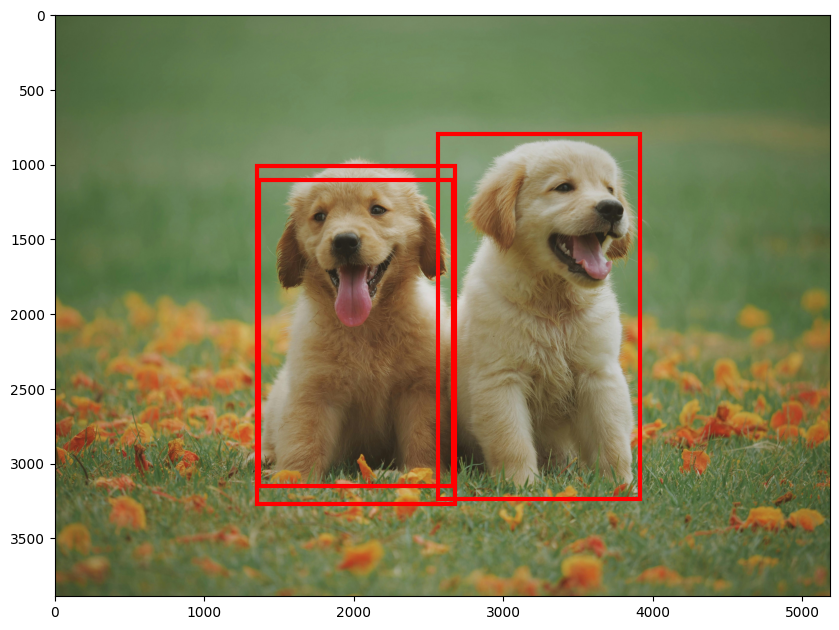

In [7]:

image_path = "/content/Dog.jpg"
outputs, image = segment_image(image_path)
visualize_segmentation(outputs, image)

In [8]:
import os
import cv2
import numpy as np

# Create directory to store segmented objects
def create_output_dir(output_dir):
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)


In [9]:
# Extract and save each segmented object
def extract_objects(outputs, image, output_dir, threshold=0.5):
    create_output_dir(output_dir)
    objects_metadata = []

    for idx, (box, score) in enumerate(zip(outputs['boxes'], outputs['scores'])):
        if score > threshold:
            x1, y1, x2, y2 = map(int, box)
            object_image = image.crop((x1, y1, x2, y2))
            object_image.save(os.path.join(output_dir, f"object_{idx}.jpg"))

            # Save metadata
            objects_metadata.append({
                "object_id": idx,
                "bounding_box": [x1, y1, x2, y2],
                "image_path": os.path.join(output_dir, f"object_{idx}.jpg")
            })

    return objects_metadata

In [10]:
output_dir = "segmented_objects"
objects_metadata = extract_objects(outputs, image, output_dir)
print(objects_metadata)

[{'object_id': 0, 'bounding_box': [2565, 797, 3912, 3235], 'image_path': 'segmented_objects/object_0.jpg'}, {'object_id': 1, 'bounding_box': [1354, 1011, 2674, 3272], 'image_path': 'segmented_objects/object_1.jpg'}, {'object_id': 2, 'bounding_box': [1365, 1102, 2665, 3149], 'image_path': 'segmented_objects/object_2.jpg'}]


In [11]:

!pip install torch torchvision opencv-python pillow



In [12]:
import torch
from PIL import Image
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [13]:
# Load the YOLOv5 model
model = torch.hub.load('ultralytics/yolov5', 'yolov5s', pretrained=True)

/usr/local/lib/python3.10/dist-packages/torch/hub.py:295: UserWarning: You are about to download and run code from an untrusted repository. In a future release, this won't be allowed. To add the repository to your trusted list, change the command to {calling_fn}(..., trust_repo=False) and a command prompt will appear asking for an explicit confirmation of trust, or load(..., trust_repo=True), which will assume that the prompt is to be answered with 'yes'. You can also use load(..., trust_repo='check') which will only prompt for confirmation if the repo is not already trusted. This will eventually be the default behaviour
  warnings.warn(
Downloading: "https://github.com/ultralytics/yolov5/zipball/master" to /root/.cache/torch/hub/master.zip


requirements: Ultralytics requirements ['gitpython>=3.1.30', 'pillow>=10.3.0'] not found, attempting AutoUpdate...
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 33.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 193.2 MB/s eta 0:00:00
  Attempting uninstall: pillow
    Found existing installation: Pillow 9.4.0
    Uninstalling Pillow-9.4.0:
      Successfully uninstalled Pillow-9.4.0

requirements: AutoUpdate success ✅ 5.7s, installed 2 packages: ['gitpython>=3.1.30', 'pillow>=10.3.0']
requirements: ⚠️ Restart runtime or rerun command for updates to take effect



YOLOv5 🚀 2024-8-18 Python-3.10.12 torch-2.4.0+cu121 CPU

100%|██████████| 14.1M/14.1M [00:00<00:00, 133MB/s]

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 


In [14]:
# Function to identify objects in an image
def identify_objects_yolo(image):
    results = model(image)
    return results


In [15]:
# Function to get descriptions for detected objects
def get_object_descriptions(results):
    descriptions = []
    for detection in results.xyxy[0]:  # Iterate over detections
        class_id = int(detection[5])
        class_name = results.names[class_id]  # Get class name
        confidence = detection[4].item()  # Get confidence score
        description = f"Object: {class_name}, Confidence: {confidence:.2f}"
        descriptions.append(description)
    return descriptions

In [16]:

# Function to save descriptions and metadata to a CSV file
def save_object_descriptions(descriptions, results):
    data = []
    for i, detection in enumerate(results.xyxy[0]):
        class_id = int(detection[5])
        class_name = results.names[class_id]
        confidence = detection[4].item()
        bbox = detection[:4].tolist()  # Get bounding box
        data.append({
            "Object ID": i + 1,
            "Class Name": class_name,
            "Confidence": confidence,
            "Bounding Box": bbox
        })
        import pandas as pd

    df = pd.DataFrame(data)
    df.to_csv("object_descriptions.csv", index=False)
    return df

/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:869: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


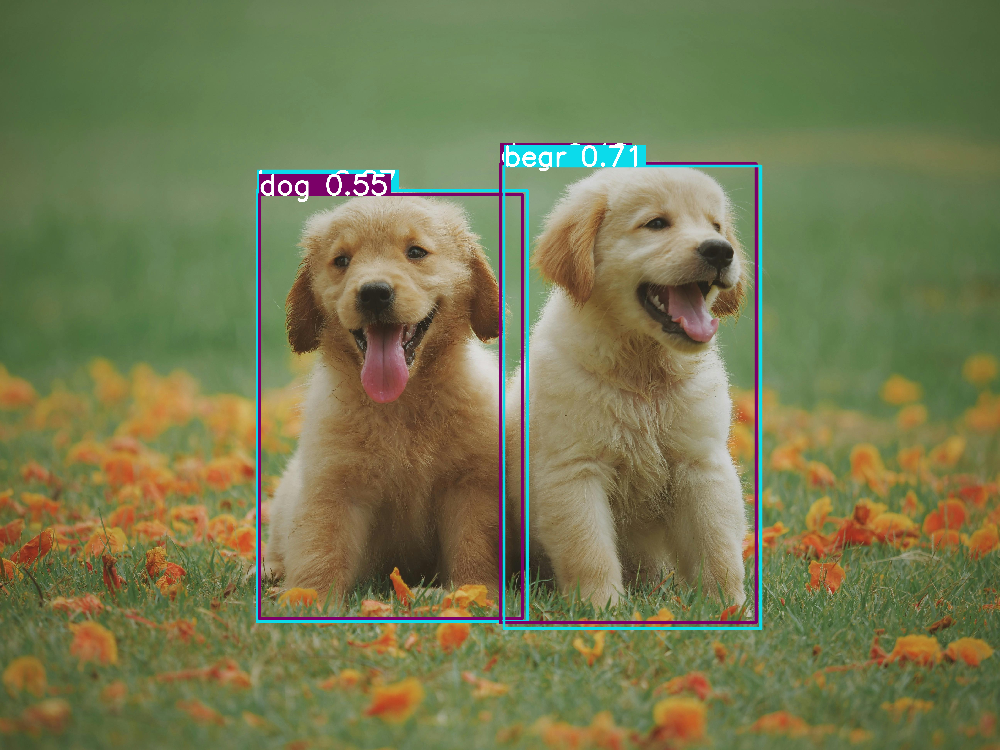

In [17]:
image_path = "/content/Dog.jpg"
image = Image.open(image_path)

# Identify objects in the image
results = identify_objects_yolo(image)
results.show()  # Display the image with bounding boxes and labels

In [18]:
# Extract and print descriptions
descriptions = get_object_descriptions(results)
for desc in descriptions:
    print(desc)

# Save descriptions to a CSV file
df = save_object_descriptions(descriptions, results)
print(df)

Object: bear, Confidence: 0.71
Object: dog, Confidence: 0.55
Object: dog, Confidence: 0.48
Object: bear, Confidence: 0.27
   Object ID Class Name  Confidence  \
0          1       bear    0.712497   
1          2        dog    0.554034   
2          3        dog    0.475807   
3          4       bear    0.269057   

                                        Bounding Box  
0  [2612.938720703125, 860.2058715820312, 3944.40...  
1  [1344.8287353515625, 1009.307861328125, 2708.3...  
2  [2594.5068359375, 849.9132690429688, 3919.6115...  
3  [1333.43896484375, 987.3014526367188, 2732.586...  


In [19]:
!pip install easyocr # Install the EasyOCR library
import easyocr

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 10.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 307.2/307.2 kB 15.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 908.3/908.3 kB 32.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 281.3/281.3 kB 15.7 MB/s eta 0:00:00


In [20]:
# Initialize the EasyOCR reader
reader = easyocr.Reader(['en'])

Progress: |██████████████████████████████████████████████████| 100.0% Complete

Progress: |██████████████████████████████████████████████████| 100.0% Complete

In [21]:
 # Function to extract text from objects
def extract_text(objects_metadata):
    extracted_text = []

    for obj in objects_metadata:
        text = reader.readtext(obj['image_path'], detail=0)
        extracted_text.append({"object_id": obj['object_id'], "text": text})

    return extracted_text

In [22]:
extracted_text = extract_text(objects_metadata)
print(extracted_text)

[{'object_id': 0, 'text': []}, {'object_id': 1, 'text': []}, {'object_id': 2, 'text': []}]


In [23]:
def summarize_attributes(objects_metadata, descriptions, extracted_text):
    summaries = []

    for obj, desc, text in zip(objects_metadata, descriptions, extracted_text):
        summary = f"Object ID: {obj['object_id']}\nDescription: {desc}\nExtracted Text: {text['text']}\n"
        summaries.append(summary)

    return summaries

# Example usage
summaries = summarize_attributes(objects_metadata, descriptions, extracted_text)
for summary in summaries:
    print(summary)

Object ID: 0
Description: Object: bear, Confidence: 0.71
Extracted Text: []

Object ID: 1
Description: Object: dog, Confidence: 0.55
Extracted Text: []

Object ID: 2
Description: Object: dog, Confidence: 0.48
Extracted Text: []



In [24]:
import json

# Map data to objects and save as JSON
def map_data(objects_metadata, descriptions, extracted_text, summaries):
    mapped_data = []

    for obj, desc, text, summary in zip(objects_metadata, descriptions, extracted_text, summaries):
        mapped_data.append({
            "object_id": obj['object_id'],
            "image_path": obj['image_path'],
            "bounding_box": obj['bounding_box'],
            "description": desc,
            "extracted_text": text['text'],
            "summary": summary
        })

    with open("mapped_data.json", "w") as f:
        json.dump(mapped_data, f)

    return mapped_data

# Example usage
mapped_data = map_data(objects_metadata, descriptions, extracted_text, summaries)
print(mapped_data)

[{'object_id': 0, 'image_path': 'segmented_objects/object_0.jpg', 'bounding_box': [2565, 797, 3912, 3235], 'description': 'Object: bear, Confidence: 0.71', 'extracted_text': [], 'summary': 'Object ID: 0\nDescription: Object: bear, Confidence: 0.71\nExtracted Text: []\n'}, {'object_id': 1, 'image_path': 'segmented_objects/object_1.jpg', 'bounding_box': [1354, 1011, 2674, 3272], 'description': 'Object: dog, Confidence: 0.55', 'extracted_text': [], 'summary': 'Object ID: 1\nDescription: Object: dog, Confidence: 0.55\nExtracted Text: []\n'}, {'object_id': 2, 'image_path': 'segmented_objects/object_2.jpg', 'bounding_box': [1365, 1102, 2665, 3149], 'description': 'Object: dog, Confidence: 0.48', 'extracted_text': [], 'summary': 'Object ID: 2\nDescription: Object: dog, Confidence: 0.48\nExtracted Text: []\n'}]


In [25]:
import pandas as pd

# Generate table summarizing all mapped data
def generate_summary_table(mapped_data):
    df = pd.DataFrame(mapped_data)
    df.to_csv("object_summary.csv", index=False)
    return df

# Example usage
summary_table = generate_summary_table(mapped_data)
print(summary_table)

# Annotate the original image with bounding boxes and labels
def annotate_image(outputs, image, mapped_data, threshold=0.5):
    plt.figure(figsize=(10, 10))
    plt.imshow(image)
    for obj in mapped_data:
        x1, y1, x2, y2 = obj['bounding_box']
        plt.gca().add_patch(plt.Rectangle((x1, y1), x2 - x1, y2 - y1, fill=False, color='blue', linewidth=2))
        plt.text(x1, y1, obj['description'], fontsize=12, color='blue', bbox=dict(facecolor='yellow', alpha=0.5))
    plt.show()

# Example usage
annotate_image(outputs, image, mapped_data)

   object_id                      image_path              bounding_box  \
0          0  segmented_objects/object_0.jpg   [2565, 797, 3912, 3235]   
1          1  segmented_objects/object_1.jpg  [1354, 1011, 2674, 3272]   
2          2  segmented_objects/object_2.jpg  [1365, 1102, 2665, 3149]   

                      description extracted_text  \
0  Object: bear, Confidence: 0.71             []   
1   Object: dog, Confidence: 0.55             []   
2   Object: dog, Confidence: 0.48             []   

                                             summary  
0  Object ID: 0\nDescription: Object: bear, Confi...  
1  Object ID: 1\nDescription: Object: dog, Confid...  
2  Object ID: 2\nDescription: Object: dog, Confid...  
